# Preferential Bayesian Optimization: RANDOM
This notebook demonstrates the use of random querying on ordinal (preference) data.

Formulation by Nguyen Quoc Phong.

In [1]:
import numpy as np
import gpflow
import tensorflow as tf
import tensorflow_probability as tfp
import matplotlib.pyplot as plt
import sys
import os
import pickle

from gpflow.utilities import set_trainable, print_summary
gpflow.config.set_default_summary_fmt("notebook")

sys.path.append(os.path.split(os.path.split(os.path.split(os.getcwd())[0])[0])[0]) # Move 3 levels up directory to import PBO
import PBO

In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  5


In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only use the first GPU
    try:
        for gpu in gpus:
              tf.config.experimental.set_memory_growth(gpu, True)
        tf.config.experimental.set_visible_devices(gpus[1], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

5 Physical GPUs, 1 Logical GPU


In [4]:
lengthscale = 1.
lengthscale_prior_alpha = tf.constant(3, dtype=tf.float64)
lengthscale_prior_beta = tf.constant(3, dtype=tf.float64)

In [5]:
objective = PBO.objectives.six_hump_camel
objective_low = -1.5
objective_high = 1.5
objective_name = "SHC"
acquisition_name = "RANDOM_TEST"
experiment_name = "PBO" + "_" + acquisition_name + "_" + objective_name

In [6]:
num_runs = 1
num_evals = 20
num_samples = 1000
num_choices = 2
input_dims = 2
num_maximizers = 20
num_init_points = 3
num_inducing_init = 3
num_discrete_per_dim = 1000 # Discretization of continuous input space

In [7]:
results_dir = os.getcwd() + '/results/' + experiment_name + '/'

try:
    # Create target Directory
    os.makedirs(results_dir)
    print("Directory " , results_dir ,  " created ") 
except FileExistsError:
    print("Directory " , results_dir ,  " already exists")

Directory  /home/sebtsh/PBO/notebooks/RANDOM/results/PBO_RANDOM_TEST_SHC/  already exists


Plot of the SHC function (global min at at x = [0.0898, -0.7126] and x = [-0.0898, 0.7126]):

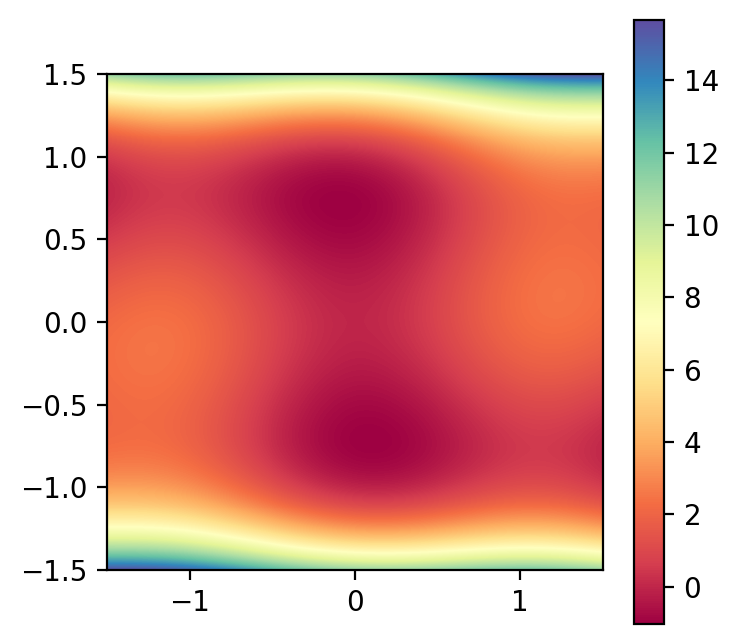

In [8]:
side = np.linspace(objective_low, objective_high, num_discrete_per_dim)
X,Y = np.meshgrid(side,side)
combs = PBO.acquisitions.dts.combinations(np.expand_dims(side, axis=1))
fvals = objective(combs)
preds = tf.transpose(tf.reshape(fvals, [num_discrete_per_dim, num_discrete_per_dim]))
plt.figure(figsize=(4, 4), dpi=200)
plt.imshow(preds, 
           interpolation='nearest', 
           extent=(objective_low, objective_high, objective_low, objective_high), 
           origin='lower', 
           cmap='Spectral')
plt.colorbar()

In [9]:
def plot_gp(model, inducing_points, inputs, title, cmap="Spectral"):

    side = np.linspace(objective_low, objective_high, num_discrete_per_dim)
    combs = PBO.acquisitions.dts.combinations(np.expand_dims(side, axis=1))
    predictions = model.predict_y(combs)
    preds = tf.transpose(tf.reshape(predictions[0], [num_discrete_per_dim, num_discrete_per_dim]))
    variances = tf.transpose(tf.reshape(predictions[1], [num_discrete_per_dim, num_discrete_per_dim]))

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.suptitle(title)
    fig.set_size_inches(18.5, 6.88)
    fig.set_dpi((200))

    ax1.axis('equal')
    im1 = ax1.imshow(preds, 
                     interpolation='nearest', 
                     extent=(objective_low, objective_high, objective_low, objective_high), 
                     origin='lower', 
                     cmap=cmap)
    ax1.plot(inducing_points[:, 0], inducing_points[:, 1], 'kx', mew=2)
    ax1.plot(inputs[:, 0], inputs[:, 1], 'ko', mew=2, color='w')
    ax1.set_title("Mean")
    ax1.set_xlabel("x0")
    ax1.set_ylabel("x1")
    fig.colorbar(im1, ax=ax1)

    ax2.axis('equal')
    im2 = ax2.imshow(variances, 
                     interpolation='nearest', 
                     extent=(objective_low, objective_high, objective_low, objective_high), 
                     origin='lower', 
                     cmap=cmap)
    ax2.plot(inducing_points[:, 0], inducing_points[:, 1], 'kx', mew=2)
    ax2.plot(inputs[:, 0], inputs[:, 1], 'ko', mew=2, color='w')
    ax2.set_title("Variance")
    ax2.set_xlabel("x0")
    ax2.set_ylabel("x1")
    fig.colorbar(im2, ax=ax2)

    plt.savefig(fname=results_dir + title + ".png")
    plt.show()

In [10]:
def get_noisy_observation(X, objective):
    f = PBO.objectives.objective_get_f_neg(X, objective)
    return PBO.observation_model.gen_observation_from_f(X, f, 1)

In [11]:
def train_and_visualize(X, y, num_inducing, title):
    lengthscale_prior = tfp.distributions.Gamma(concentration=lengthscale_prior_alpha,
                                               rate=lengthscale_prior_beta)
    
    # Train model with data
    q_mu, q_sqrt, u, inputs, k, indifference_threshold = PBO.models.learning_stochastic.train_model_fullcov(X, y, 
                                                                         num_inducing=num_inducing,
                                                                         obj_low=objective_low,
                                                                         obj_high=objective_high,
                                                                         lengthscale=lengthscale,
                                                                         lengthscale_prior=None,
                                                                         lengthscale_lower_bound=None,
                                                                         num_steps=3000,
                                                                         indifference_threshold=None)
    likelihood = gpflow.likelihoods.Gaussian()
    model = PBO.models.learning.init_SVGP_fullcov(q_mu, q_sqrt, u, k, likelihood)
    u_mean = q_mu.numpy()
    inducing_vars = u.numpy()
    
    # Visualize model
    plot_gp(model, inducing_vars, inputs, title)
    
    return model, inputs, u_mean, inducing_vars

In [12]:
def uniform_grid(input_dims, num_discrete_per_dim, low=0., high=1.):
    """
    Returns an array with all possible permutations of discrete values in input_dims number of dimensions.
    :param input_dims: int
    :param num_discrete_per_dim: int
    :param low: int
    :param high: int
    :return: tensor of shape (num_discrete_per_dim ** input_dims, input_dims)
    """
    num_points = num_discrete_per_dim ** input_dims
    out = np.zeros([num_points, input_dims])
    discrete_points = np.linspace(low, high, num_discrete_per_dim)
    for i in range(num_points):
        for dim in range(input_dims):
            val = num_discrete_per_dim ** (dim)
            out[i, dim] = discrete_points[int((i // val) % num_discrete_per_dim)]
    return out

This function is our main metric for the performance of the acquisition function: The closer the model's best guess to the global minimum, the better.

In [13]:
def best_guess(model):
    """
    Returns a GP model's best guess of the global maximum of f.
    """
    xx = uniform_grid(input_dims, num_discrete_per_dim, low=objective_low, high=objective_high)
    res = model.predict_f(xx)[0].numpy()
    return xx[np.argmax(res)]

Store the results in these arrays:

In [14]:
num_data_at_end = int((num_init_points-1) * num_init_points / 2 + num_evals)
X_results = np.zeros([num_runs, num_data_at_end, num_choices, input_dims])
y_results = np.zeros([num_runs, num_data_at_end, 1, input_dims])
best_guess_results = np.zeros([num_runs, num_evals, input_dims])

Create the initial values for each run:

In [15]:
np.random.seed(0)
init_points = np.random.uniform(low=objective_low, high=objective_high, size=[num_runs, num_init_points, input_dims])
num_combs = int((num_init_points-1) * num_init_points / 2)
init_vals = np.zeros([num_runs, num_combs, num_choices, input_dims])
for run in range(num_runs):
    cur_idx = 0
    for init_point in range(num_init_points-1):
        for next_point in range(init_point+1, num_init_points):
            init_vals[run, cur_idx, 0] = init_points[run, init_point]
            init_vals[run, cur_idx, 1] = init_points[run, next_point]
            cur_idx += 1

The following loops carry out the Bayesian optimization algorithm over a number of runs, with a fixed number of evaluations per run.

In [16]:
np.random.seed(1)
draws = np.random.uniform(low=objective_low, 
                                         high=objective_high, 
                                         size=(num_evals, input_dims))

In [17]:
draws

array([[-0.24893399,  0.66097348],
       [-1.49965688, -0.59300228],
       [-1.05973233, -1.22298422],
       [-0.94121937, -0.46331782],
       [-0.30969758,  0.1164502 ],
       [-0.24241646,  0.5556585 ],
       [-0.88664325,  1.13435231],
       [-1.41783722,  0.51140253],
       [-0.24808559,  0.17606949],
       [-1.07883918, -0.90569553],
       [ 0.90223371,  1.40478473],
       [-0.55972747,  0.57696785],
       [ 1.12916746,  1.18381999],
       [-1.24486737, -1.38283565],
       [-0.99050874,  1.13442751],
       [-1.2049595 , -0.23667712],
       [ 1.37366859,  0.09949585],
       [ 0.57563134, -0.55345311],
       [ 0.55950278,  1.00387702],
       [-1.44513517,  0.75043294]])

Beginning run 0
Indifference_threshold is trainable.
Instructions for updating:
Use tf.identity instead.
Negative ELBO at step 0: 6.560178163609044 in 0.8184s
Negative ELBO at step 500: 2.180236457071486 in 64.0043s
Negative ELBO at step 1000: 2.1342405661396375 in 63.1771s
Negative ELBO at step 1500: 2.0866243586758073 in 63.6908s
Negative ELBO at step 2000: 2.086276514708474 in 61.5306s
Negative ELBO at step 2500: 1.974594803122938 in 59.4400s


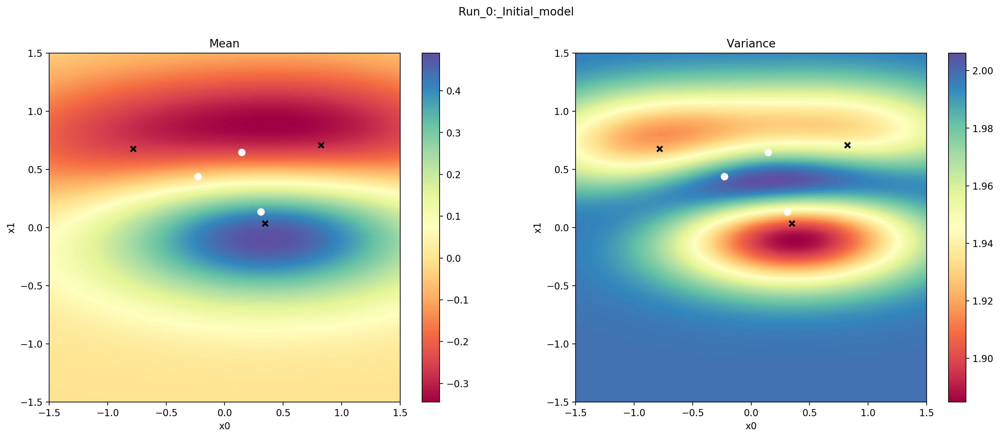

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,0.9983218797791313
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[1.04762347 0.44811257]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(3, 2)",float64,"[[0.34815395, 0.03550745..."
SVGP.q_mu,Parameter,,,False,"(3, 1)",float64,[[ 0.45462247] [-0.25119467] [-0.27987088]]
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3, 3)",float64,"[[[0.95158892, 0., 0...."


Beginning evaluation 0
Evaluation 0: Next query is [[ 0.30829013  0.13464955]
 [-0.24893399  0.66097348]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]]
Evaluation 0: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 3.5254434085297097 in 0.2076s
Negative ELBO at step 500: 2.794037362424852 in 69.3731s
Negative ELBO at step 1000: 2.916122044790674 in 67.7514s
Negative ELBO at step 1500: 2.8706583468923634 in 67.5029s
Negative ELBO at step 2000: 2.8560642628606225 in 67.7864s
Negative ELBO at step 2500: 2.8618008955412333 in 68.0549s


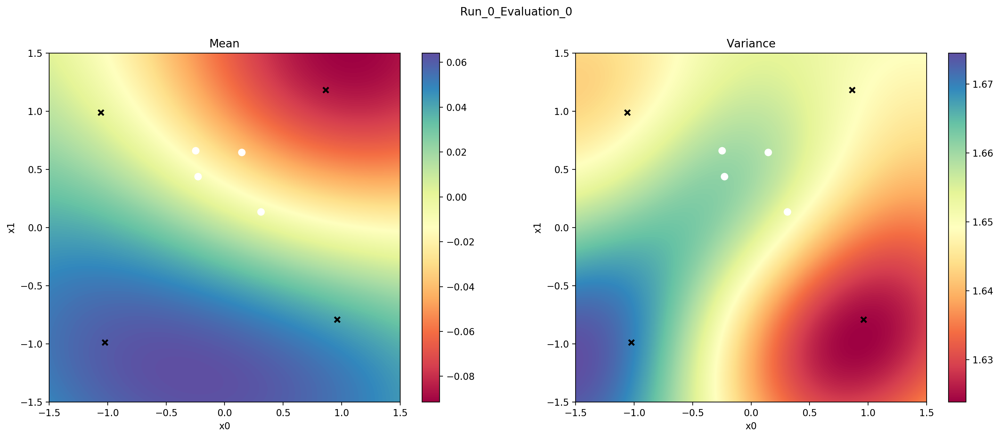

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,0.6591368737581998
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[1.46123742 1.35851178]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(4, 2)",float64,"[[-1.05709754, 0.98727279..."
SVGP.q_mu,Parameter,,,False,"(4, 1)",float64,[[0.00018378...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 4, 4)",float64,"[[[0.80422929, 0., 0...."


Best guess: [-0.3048048  -1.27177177]
Best guess val: 4.735768925462757
Beginning evaluation 1
Evaluation 1: Next query is [[ 0.14644051  0.6455681 ]
 [-1.49965688 -0.59300228]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]]]
Evaluation 1: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 9.863215915145169 in 0.2798s
Negative ELBO at step 500: 3.7180569351142916 in 79.3504s
Negative ELBO at step 1000: 3.608466389863609 in 80.0131s
Negative ELBO at step 1500: 3.675057276727388 in 78.8921s
Negative ELBO at step 2000: 3.623606912305302 in 78.4729s
Negative ELBO at step 25

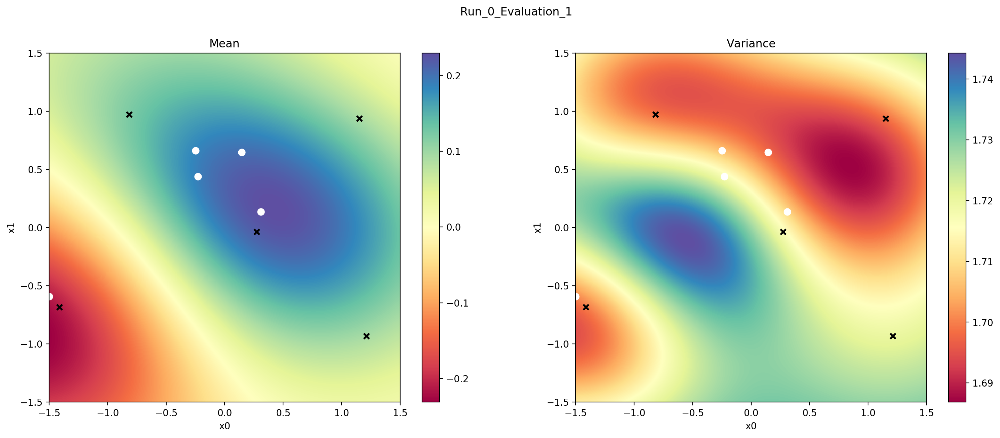

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,0.7404548363480672
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[1.21173979 0.95759722]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(5, 2)",float64,"[[1.15156745, 0.93577622..."
SVGP.q_mu,Parameter,,,False,"(5, 1)",float64,[[0.09242194...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 5, 5)",float64,"[[[0.83580667, 0., 0...."


Best guess: [0.42192192 0.17267267]
Best guess val: 0.6045499040083296
Beginning evaluation 2
Evaluation 2: Next query is [[-0.24893399  0.66097348]
 [-1.05973233 -1.22298422]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]]

 [[-0.24893399  0.66097348]]]
Evaluation 2: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 17.91022219979037 in 0.3239s
Negative ELBO at step 500: 4.627060000201498 in 92.3675s
Negative ELBO at step 1000: 4.640747436569493 in 95.6512s
Negative ELBO at step 1500: 4.395999325123047 in 97.40

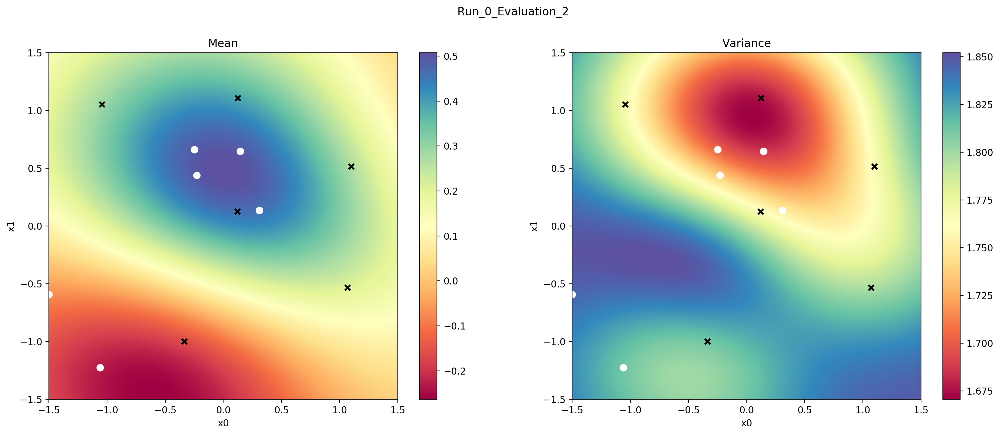

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,0.8504342419559685
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[1.04848346 0.89607468]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(6, 2)",float64,"[[1.10039453, 0.51372101..."
SVGP.q_mu,Parameter,,,False,"(6, 1)",float64,[[0.26934496...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 6, 6)",float64,"[[[0.87450832, 0., 0...."


Best guess: [0.01351351 0.48498498]
Best guess val: -0.7122617051593504
Beginning evaluation 3
Evaluation 3: Next query is [[-1.05973233 -1.22298422]
 [-0.94121937 -0.46331782]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]]

 [[-0.24893399  0.66097348]]

 [[-0.94121937 -0.46331782]]]
Evaluation 3: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 63.57833002726191 in 0.3217s
Negative ELBO at step 500: 6.8606801071500545 in 109.9319s
Negative ELBO at step

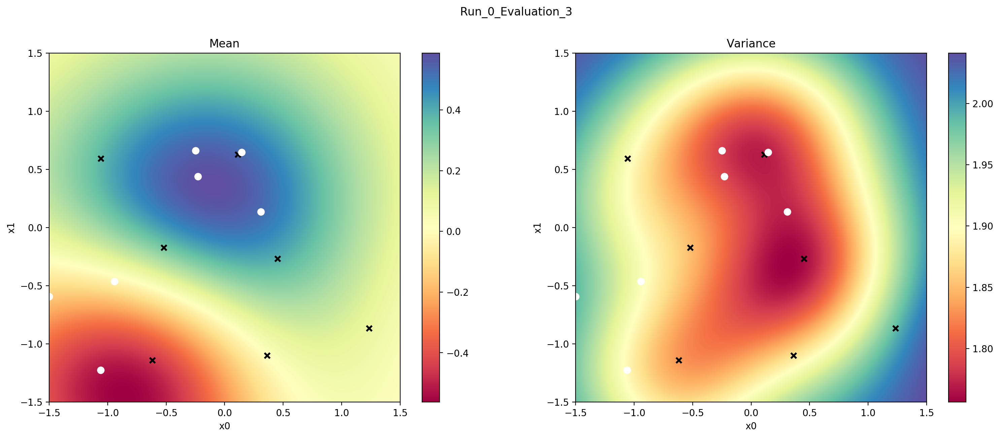

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.047366132460192
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.88490221 0.84344378]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(7, 2)",float64,"[[0.11430417, 0.62639236..."
SVGP.q_mu,Parameter,,,False,"(7, 1)",float64,[[0.53743493...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 7, 7)",float64,"[[[0.87755608, 0., 0...."


Best guess: [-0.10960961  0.37087087]
Best guess val: -0.4674025668221006
Beginning evaluation 4
Evaluation 4: Next query is [[-0.2290356   0.43768234]
 [-0.30969758  0.1164502 ]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]]

 [[-0.24893399  0.66097348]]

 [[-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]]]
Evaluation 4: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 75.22522905068854 i

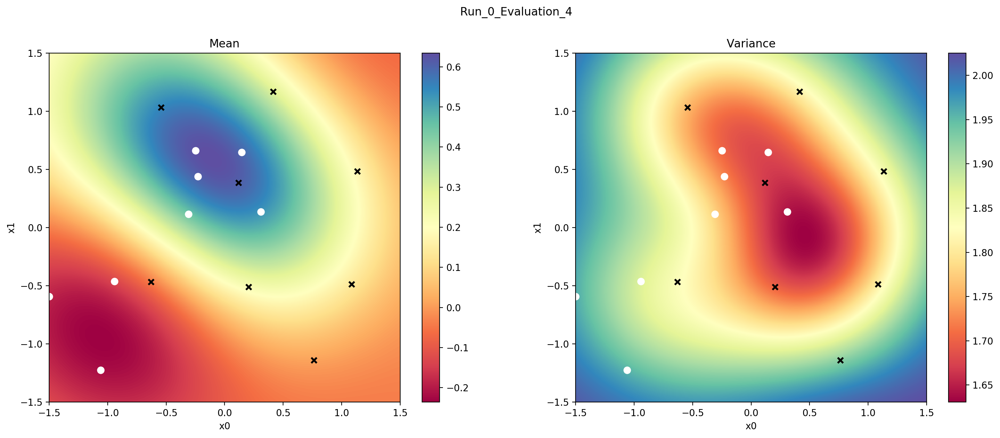

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.036730546960575
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.8790108 0.86583738]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(8, 2)",float64,"[[0.20663291, -0.51163262..."
SVGP.q_mu,Parameter,,,False,"(8, 1)",float64,[[0.22356455...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 8, 8)",float64,"[[[0.83846321, 0., 0...."


Best guess: [-0.11861862  0.6021021 ]
Best guess val: -0.9399584654948109
Beginning evaluation 5
Evaluation 5: Next query is [[-1.49965688 -0.59300228]
 [-0.24241646  0.5556585 ]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]]

 [[-0.24893399  0.66097348]]

 [[-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]]

 [[-0.24241646  0.5556585 ]]]
Evaluation 5: Training

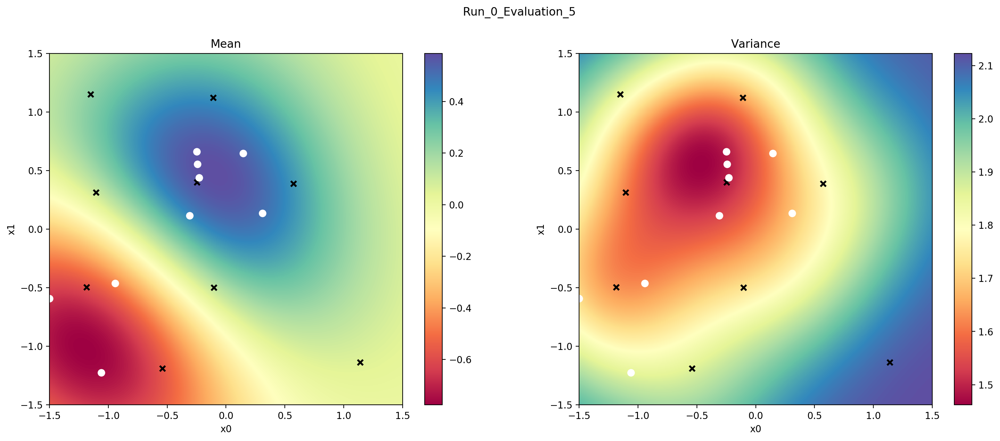

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.115592638350451
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.86007891 0.85446335]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(9, 2)",float64,"[[-1.10256476, 0.31212544..."
SVGP.q_mu,Parameter,,,False,"(9, 1)",float64,[[0.10202691...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 9, 9)",float64,"[[[7.83459366e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.09459459  0.48198198]
Best guess val: -0.7233292879754756
Beginning evaluation 6
Evaluation 6: Next query is [[-0.24241646  0.5556585 ]
 [-0.88664325  1.13435231]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]]

 [[-0.24893399  0.66097348]]

 [[-0.94121937 -0.46331782]]

 [[-0.2290356   0.437682

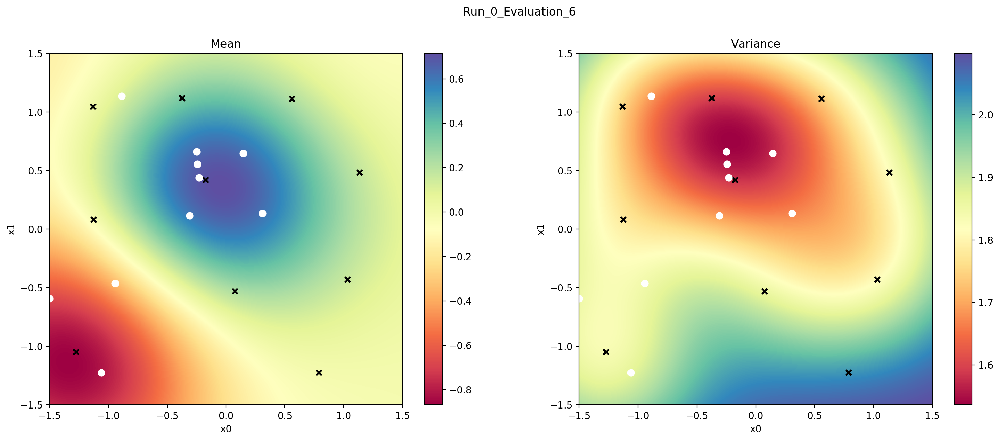

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1191623190548707
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.85484987 0.8348886 ]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(10, 2)",float64,"[[1.13519416, 0.48332921..."
SVGP.q_mu,Parameter,,,False,"(10, 1)",float64,[[0.17251797...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 10, 10)",float64,"[[[9.05418361e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.04654655  0.37387387]
Best guess val: -0.48971709705766797
Beginning evaluation 7
Evaluation 7: Next query is [[ 0.30829013  0.13464955]
 [-1.41783722  0.51140253]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]]

 [[-0.24893399  0.6609734

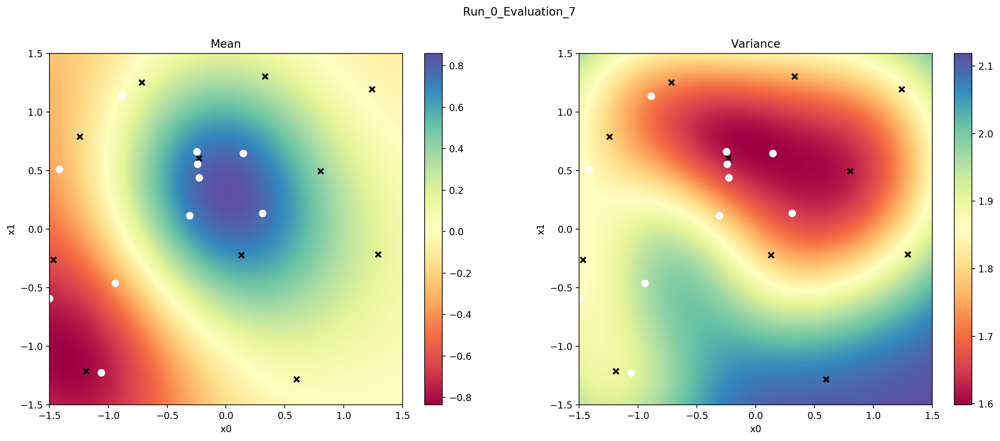

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1273878101633033
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.826987 0.85056157]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(11, 2)",float64,"[[-1.46660492, -0.26311313..."
SVGP.q_mu,Parameter,,,False,"(11, 1)",float64,[[-0.58908781...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 11, 11)",float64,"[[[9.25878947e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [0.01951952 0.31381381]
Best guess val: -0.3474746621454277
Beginning evaluation 8
Evaluation 8: Next query is [[-0.88664325  1.13435231]
 [-0.24808559  0.17606949]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[-0.24893399  0.66097348]]



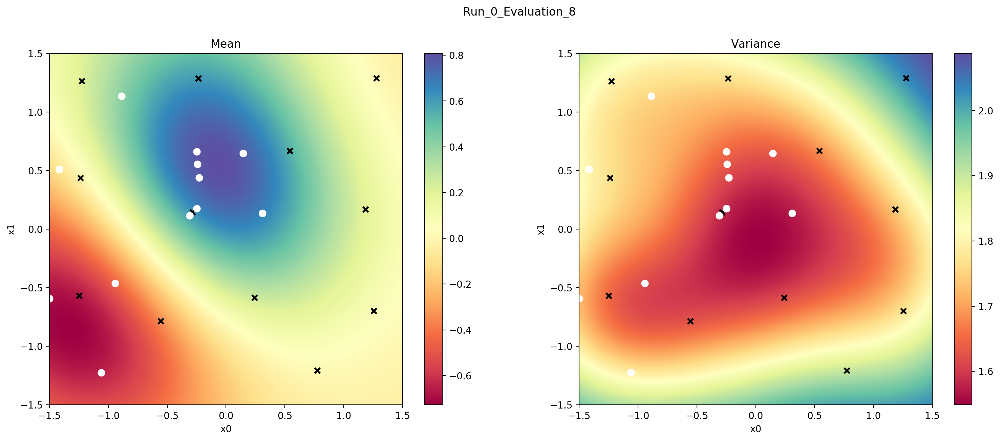

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1109079034870537
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.84604484 0.8677301 ]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(12, 2)",float64,"[[0.24394852, -0.58504043..."
SVGP.q_mu,Parameter,,,False,"(12, 1)",float64,[[0.25978001...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 12, 12)",float64,"[[[7.86649171e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.07057057  0.55705706]
Best guess val: -0.8755177643322593
Beginning evaluation 9
Evaluation 9: Next query is [[-1.05973233 -1.22298422]
 [-1.07883918 -0.90569553]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]



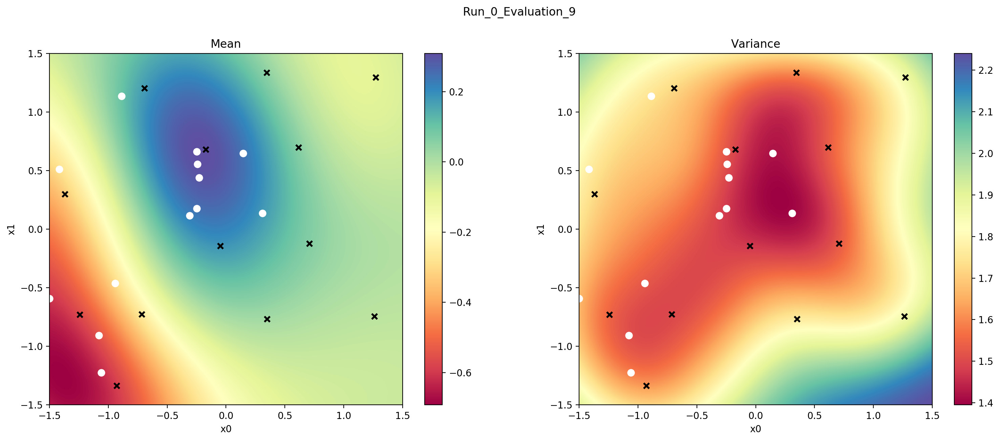

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1846817221242276
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.82965089 0.82570358]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(13, 2)",float64,"[[0.34629228, 1.33489838..."
SVGP.q_mu,Parameter,,,False,"(13, 1)",float64,[[0.0497997...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 13, 13)",float64,"[[[7.78782226e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.21171171  0.65915916]
Best guess val: -0.9472873761325228
Beginning evaluation 10
Evaluation 10: Next query is [[-1.41783722  0.51140253]
 [ 0.90223371  1.40478473]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]]
y: 

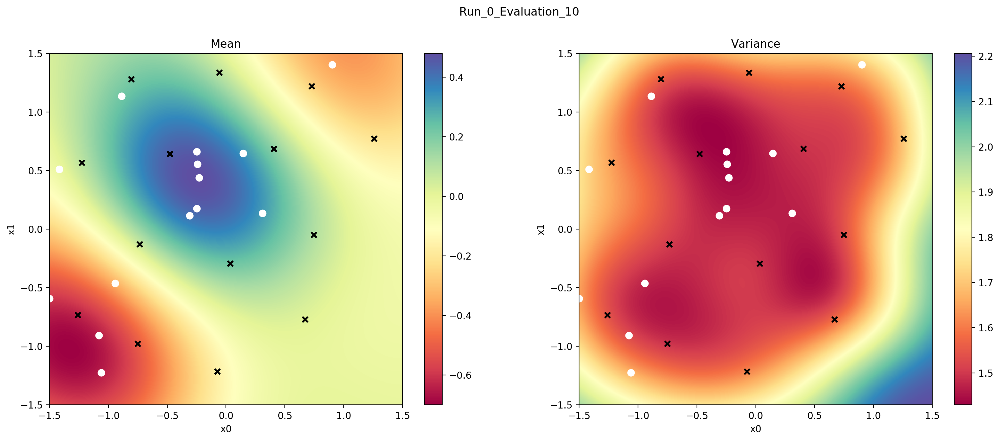

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.191343313118091
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.82403787 0.81924084]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(14, 2)",float64,"[[-1.2586165, -0.73350453..."
SVGP.q_mu,Parameter,,,False,"(14, 1)",float64,[[-0.63250141...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 14, 14)",float64,"[[[7.38792783e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.24774775  0.43693694]
Best guess val: -0.48843186312000997
Beginning evaluation 11
Evaluation 11: Next query is [[-0.30969758  0.1164502 ]
 [-0.55972747  0.57696785]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]

 [

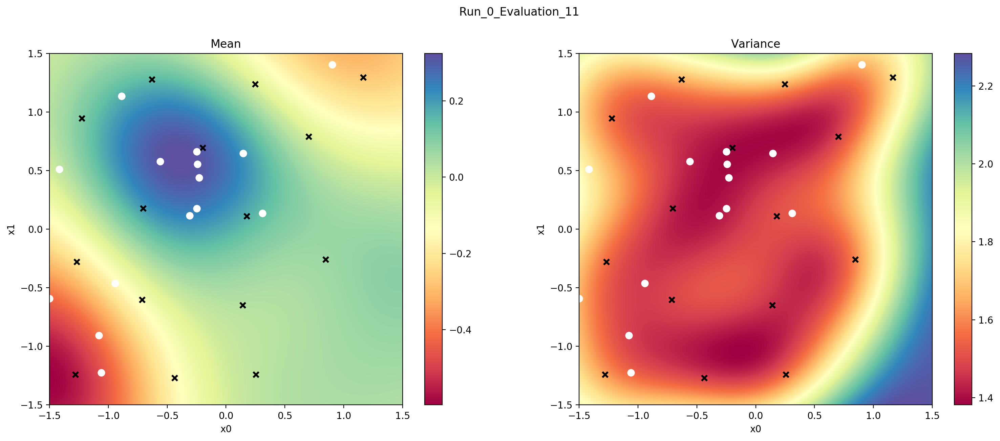

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1980737417162262
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.84003637 0.81286981]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(15, 2)",float64,"[[0.70340634, 0.78769212..."
SVGP.q_mu,Parameter,,,False,"(15, 1)",float64,[[-0.02198436...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 15, 15)",float64,"[[[0.69809473, 0., 0...."


Best guess: [-0.3978979  0.5960961]
Best guess val: -0.5714933857759417
Beginning evaluation 12
Evaluation 12: Next query is [[0.30829013 0.13464955]
 [1.12916746 1.18381999]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]

 [[-0.309

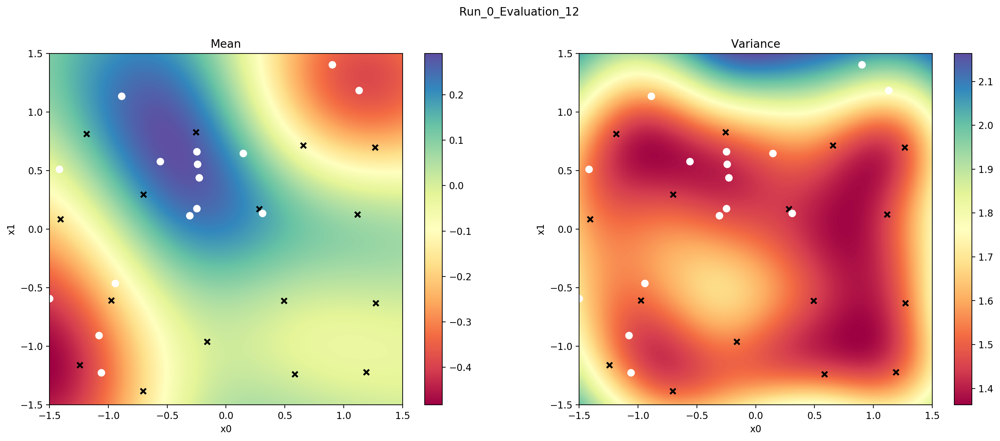

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1939821133216948
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.83972323 0.82899456]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(16, 2)",float64,"[[-1.18335649, 0.8112334..."
SVGP.q_mu,Parameter,,,False,"(16, 1)",float64,[[0.14127893...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 16, 16)",float64,"[[[6.81650716e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.46396396  0.71321321]
Best guess val: -0.5635388933344346
Beginning evaluation 13
Evaluation 13: Next query is [[-1.05973233 -1.22298422]
 [-1.24486737 -1.38283565]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]

 [[

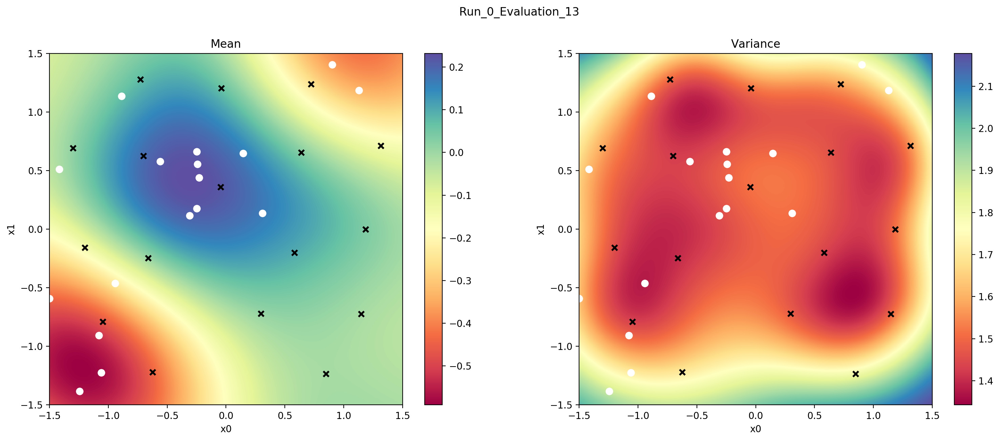

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.198157813012849
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.82812733 0.83043588]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(17, 2)",float64,"[[0.58222079, -0.20258006..."
SVGP.q_mu,Parameter,,,False,"(17, 1)",float64,[[0.09826827...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 17, 17)",float64,"[[[6.61385603e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.31381381  0.42792793]
Best guess val: -0.3587751073116021
Beginning evaluation 14
Evaluation 14: Next query is [[-1.41783722  0.51140253]
 [-0.99050874  1.13442751]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]

 [[

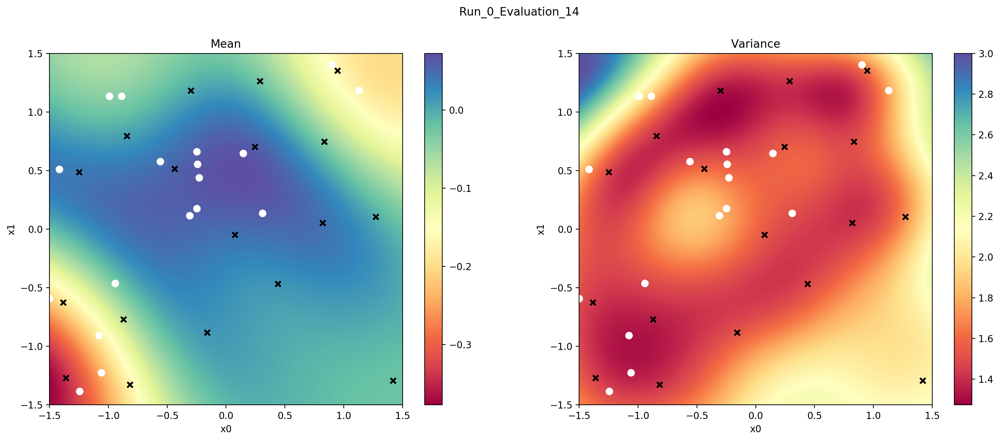

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1865511487804568
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.85795481 0.8193186 ]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(18, 2)",float64,"[[-0.87023635, -0.7704978..."
SVGP.q_mu,Parameter,,,False,"(18, 1)",float64,[[-0.07733419...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 18, 18)",float64,"[[[6.02397419e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [0.09459459 0.47297297]
Best guess val: -0.6142754990935755
Beginning evaluation 15
Evaluation 15: Next query is [[ 0.14644051  0.6455681 ]
 [-1.2049595  -0.23667712]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]

 [[-0

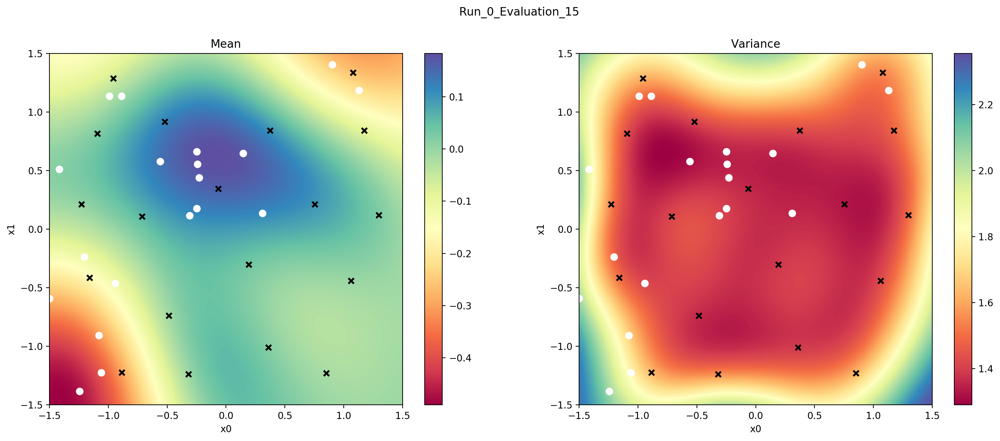

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.2025730805731494
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.82030689 0.84245233]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(19, 2)",float64,"[[0.37635406, 0.84046251..."
SVGP.q_mu,Parameter,,,False,"(19, 1)",float64,[[0.10086286...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 19, 19)",float64,"[[[0.65537991, 0., 0...."


Best guess: [-0.08258258  0.61711712]
Best guess val: -0.9669785761165403
Beginning evaluation 16
Evaluation 16: Next query is [[-1.05973233 -1.22298422]
 [ 1.37366859  0.09949585]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]

 [[

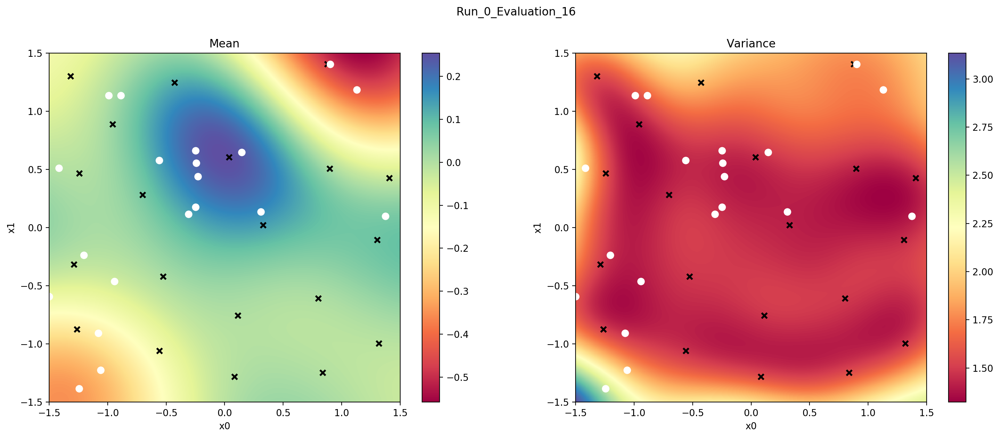

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1975725102038108
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.83195596 0.84203732]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(20, 2)",float64,"[[0.03989745, 0.6045228..."
SVGP.q_mu,Parameter,,,False,"(20, 1)",float64,[[2.52675872e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 20, 20)",float64,"[[[6.72581038e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.02852853  0.62912913]
Best guess val: -0.9712663365403824
Beginning evaluation 17
Evaluation 17: Next query is [[-0.2290356   0.43768234]
 [ 0.57563134 -0.55345311]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-0.24893399  0.66097348]
  [-1.05973233 -1.22298422]]

 [[-1.05973233 -1.22298422]
  [-0.94121937 -0.46331782]]

 [[-0.2290356   0.43768234]
  [-0.30969758  0.1164502 ]]

 [[-1.49965688 -0.59300228]
  [-0.24241646  0.5556585 ]]

 [[-0.24241646  0.5556585 ]
  [-0.88664325  1.13435231]]

 [[ 0.30829013  0.13464955]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-1.41783722  0.51140253]
  [ 0.90223371  1.40478473]]

 [[

In [ ]:
for run in range(num_runs):
    print("Beginning run %s" % (run))
    
    X = init_vals[run]
    y = get_noisy_observation(X, objective)
    
    model, inputs, u_mean, inducing_vars = train_and_visualize(X, y, num_inducing_init, "Run_{}:_Initial_model".format(run))
    print_summary(model)
    
    for evaluation in range(num_evals):
        print("Beginning evaluation %s" % (evaluation)) 
        
        existing_idx = np.random.randint(0, inputs.shape[0])
        existing_input = inputs[existing_idx]
#         random_input = np.random.uniform(low=objective_low, 
#                                          high=objective_high, 
#                                          size=(1, input_dims))
        
        next_query = np.zeros((num_choices, input_dims))
        next_query[0, :] = existing_input
        next_query[1, :] = draws[evaluation]
        print("Evaluation %s: Next query is %s" % (evaluation, next_query))

        X = np.concatenate([X, [next_query]])
        # Evaluate objective function
        y = np.concatenate([y, get_noisy_observation(np.expand_dims(next_query, axis=0), objective)], axis=0)
        
        print("X: {}".format(X))
        print("y: {}".format(y))

        print("Evaluation %s: Training model" % (evaluation))
        model, inputs, u_mean, inducing_vars = train_and_visualize(X, y, 
                                                                   num_inducing_init + evaluation + 1, 
                                                                   "Run_{}_Evaluation_{}".format(run, evaluation))
        print_summary(model)
        print("Best guess: {}".format(best_guess(model)))
        print("Best guess val: {}".format(objective(best_guess(model))))
        
        
        # Save model
        pickle.dump((X, y, inputs, 
                     model.kernel.variance, 
                     model.kernel.lengthscale, 
                     model.likelihood.variance, 
                     inducing_vars, 
                     model.q_mu, 
                     model.q_sqrt), 
                    open(results_dir + "Model_Run_{}_Evaluation_{}.p".format(run, evaluation), "wb"))

        best_guess_results[run, evaluation, :] = best_guess(model)
        

    X_results[run] = X
    y_results[run] = y

In [ ]:
pickle.dump((X_results, y_results, best_guess_results), open(results_dir + "Xybestguess.p", "wb"))

In [ ]:
def dist(x, y):
    """
    x and y have shape (..., input_dims)
    """
    return np.sqrt(np.sum((x - y) * (x - y), axis=-1))

In [ ]:
xx = uniform_grid(input_dims, num_discrete_per_dim, low=objective_low, high=objective_high)
global_min = xx[np.argmin(objective(xx))][0]

for i in range(best_guess_results.shape[0]):
    diff_from_min = dist(best_guess_results[i], global_min)
    
    x_axis = list(range(num_combs+1, num_combs+1+num_evals))
    plt.figure(figsize=(12, 6))
    plt.plot(x_axis, diff_from_min, 'kx', mew=2)
    plt.xticks(x_axis)
    plt.xlabel('Evaluations', fontsize=18)
    plt.ylabel('Best guess distance', fontsize=16)
    plt.title("Run %s" % i)
    plt.show()

In [ ]:
np.mean(PBO.objectives.six_hump_camel(best_guess_results), axis=0)